# Squeezing implemented semiclean

## Creation of the Agent

In [2]:
using CellBasedModels
    import CellBasedModels: update!
using Random
using Distributions
using GLMakie
    GLMakie.activate!()
    Makie.inline!(true)

using CSV
using DataFrames, Distances, Clustering
using GeometryBasics
using Colors
using StaticArrays
using Statistics
using Dates

In [ ]:
model = ABM(3,

    #Inherit model mechanics

    #Global parameters
    model = Dict(

        :b=>Float64,
        :λ=>Float64,
        :ζ=>Float64,
        :μ=>Float64,
        :f0=>Array{Float64},
        :f0_rep=>Array{Float64},

        :kpON=>Float64, #Protrusion rate/"probability" (Could make this different for each cell AND change with time!)
        :kpOFF=>Float64, #Protrusion duration rate/"probability" (Could make this different for each cell AND change with time!)
        :kpON_=>Array{Float64},
        :kpOFF_=>Array{Float64},
        :fRange_P=>Float64, # Protrusion force interaction range factor
        :fRange_P_min=>Float64, # Protrusion force minimum range factor for establishing protrusion bond
        :fRange_P_break=>Float64, # Protrusion force break range factor
        :fPI=>Float64, # Contractile Protrusion force magnitude
        :ε=>Float64, #LJ minimum energy for cell-cell protrusion interaction
        :p=>Float64,  #Transition rate from A to B
        :q=>Float64,  #Transition rate from B to C
        :κ0=>Array{Float64}, #Transition rate feedback factor constant
        :fs0=>Float64, #Soft Core repulsion between B and C type cells
        :fs=>Array{Int64},
        :f0_0=>Float64, #Attraction between  cells
        :f0_0_rep=>Float64, #Hard Core repulsion between  cells
        :fPI_=>Array{Float64}, # Contractile Protrusion force magnitude

        #Division constants:
        :τDiv_=>Array{Float64},
        :τDiv_pre_=>Array{Float64},
        :σDiv_=>Array{Float64},

        # velocity dissipation:
        :vel_diss=>Float64,

        # Squeezing
        :z_plate_height=>Float64,
        :z_plate_height_min=>Float64,
        :dz_plate_height_displacement=>Float64,
        :Fz_squeeze=>Float64,
        :cell_plate_contact_dist=>Float64,
        :z_substrate_height=>Float64,
        :z_substrate_height_min=>Float64,
        :dz_substrate_height_displacement=>Float64,
        :cell_substrate_contact_dist=>Float64,

        #Chemical constants
        :α=>Float64, 
        :K=>Float64, 
        :nn=>Float64, 
        :mm=>Float64,
        #Physical constants
        :fRange=>Float64,
        :mi=>Float64, 
        :ri=>Float64, 
        :k0=>Float64,
        #Division constants
        :fAdh=>Float64, 
        :τDiv=>Float64, 
        :σDiv=>Float64, 
        :c0=>Float64, 
        :σc=>Float64, 
        :nCirc=>Float64, 
        :σNCirc=>Float64,
        :fMin=>Float64, 
        :fMax=>Float64, 
        :fPrE=>Float64, 
        :fEPI=>Float64, 
        :τCirc=>Float64, 
        :στCirc=>Float64, 
        :rESC=>Float64,
        :nOn=>Float64, 
        :cMax=>Float64
    ),

    #Local float parameters
    agent = Dict(

        :m=>Float64,
        :r=>Float64,
        :vx=>Float64,
        :vy=>Float64,
        :vz=>Float64,
        :fx=>Float64,
        :fy=>Float64,
        :fz=>Float64,

        :fpx=>Float64,
        :fpy=>Float64,
        :fpz=>Float64,

        :nNeighs=>Int64,  #Number of neighbors that the agent has for velocity term in forces
        :nNeighs_A=>Int64,  #Number of neighbors that the agent has in state A (cellFate = 1)
        :nNeighs_B=>Int64,  #Number of neighbors that the agent has in state B (cellFate = 2)
        :nNeighs_C=>Int64,  #Number of neighbors that the agent has in state C (cellFate = 3)
        :nNeighs_P=>Int64,  #Number of neighbours that the agent has for Protrusion term in forces
        :nSumVx=>Float64, #Sum of neighbors' vx
        :nSumVy=>Float64, #Sum of neighbors' vy
        :nSumVz=>Float64, #Sum of neighbors' vz

        :kp=>Float64,  #Cell protrusion random number
        :τp=>Float64,  #Protrusion time constant
        :tij=>Float64, #Protrusion time 
        :tij_c=>Float64, #Protrusion time counter

        #For Various aggregates:
        :cell_aggregate=>Int64,
        #For controlling division:
        :cell_dividing=>Int64,
        :cell_div_relax_steps=>Int64,

        :salt_and_pepper_switch=>Int64,

        :N_start_sim_switch=>Int64,

        :N_diff_min_switch=>Int64,

        :prolif_active_switch=>Int64,

        :N_active=>Int64, # com.cellFate components out of Nmax that are actually there!
        :N_state1=>Int64, # Number of com.cellFate components that are = 1 — state A!

        :prolif_active=>Int64, # Tell if cell is chosen randomly for proliferation

        :switch_cell_plate_dist_1=>Int64,
        :switch_cell_plate_dist_2=>Int64,

        :c=>Float64,
        :tDivision=>Float64, #Variable storing the time of division of the cell
        :ci=>Float64, #Chemical activity of the neighbors
        :ni=>Float64,  #Number of neighbors
        :tOff=>Bool,    #indicate if the circuit for that cell is on or off (0,1)
        :cellFate=>Int64 #Identity of the cell (1 A, 2 B, 3 C)
    ),

    ###Mechnical & Chemical dynamics

    agentODE = quote

        fx = 0.0; 
        fy = 0.0; 
        fz = 0.0
        fmax = 1000.0  # corresponds to a distance of R/8 between the cells
        switch_fmax_x = 0
        switch_fmax_y = 0
        switch_fmax_z = 0

        @loopOverNeighbors it2 begin
            dij = sqrt((x-x[it2])^2+(y-y[it2])^2+(z-z[it2])^2)
            rij = r+r[it2]

            if dij < μ*rij && dij > 0

                if dij < rij    # 30 * [0.1 0.1 0.1; 0.1 0.1 0.1; 0.1 0.1 0.17]
                    fx += ( f0_0_rep * f0_rep[cellFate[i1_],cellFate[it2]] * (rij/dij-1)*(μ*rij/dij-1) ) * (x-x[it2])/dij 
                    fy += ( f0_0_rep * f0_rep[cellFate[i1_],cellFate[it2]] * (rij/dij-1)*(μ*rij/dij-1) ) * (y-y[it2])/dij
                    fz += ( f0_0_rep * f0_rep[cellFate[i1_],cellFate[it2]] * (rij/dij-1)*(μ*rij/dij-1) ) * (z-z[it2])/dij
                else            # 4 * [1.5 1.5 0.6; 1.5 1.5 0.4; 0.6 0.4 1.2]
                    fx += f0_0 * f0[cellFate[i1_],cellFate[it2]]*(rij/dij-1)*(μ*rij/dij-1)*(x-x[it2])/dij
                    fy += f0_0 * f0[cellFate[i1_],cellFate[it2]]*(rij/dij-1)*(μ*rij/dij-1)*(y-y[it2])/dij
                    fz += f0_0 * f0[cellFate[i1_],cellFate[it2]]*(rij/dij-1)*(μ*rij/dij-1)*(z-z[it2])/dij
                end


                if fx > fmax
                    fx = fmax
                    if switch_fmax_x == 0
                        println(" **********   fx REACHED fmax!!!   **********")
                        switch_fmax_x = 1
                    end
                end
                if fy > fmax
                    fy = fmax
                    if switch_fmax_y == 0
                        println(" **********   fy REACHED fmax!!!   **********")
                        switch_fmax_y = 1
                    end
                end
                if fz > fmax
                    fz = fmax
                    if switch_fmax_z == 0
                        println(" **********   fz REACHED fmax!!!   **********")
                        switch_fmax_z = 1
                    end
                end

            end

        end

        # Confinement

        dist_to_plate = sqrt((z-z_plate_height)^2)
        dist_to_substrate = sqrt((z-z_substrate_height)^2)

        inv_dist_plate = 1.0 / dist_to_plate
        inv_dist_substrate = 1.0 / dist_to_substrate

        plate_mask = dist_to_plate <= cell_plate_contact_dist ? 1.0 : 0.0
        substrate_mask = dist_to_substrate <= cell_substrate_contact_dist ? 1.0 : 0.0

        # Velocities 

        inv_lambda = 1.0 / λ
        inv_nNeighs = 1.0 / nNeighs

        if nNeighs < N_relV_min

            dt(x) = (fx) * inv_lambda
            dt(y) = (fy) * inv_lambda

            dt(z) = (fz + fpz) * inv_lambda +
            plate_mask * Fz_squeeze * (z - z_plate_height) * inv_dist_plate +
            substrate_mask * Fz_squeeze * (z - z_substrate_height) * inv_dist_substrate
        else

            dt(x) = (fx + nSumVx) * inv_lambda * inv_nNeighs
            dt(y) = (fy + nSumVy) * inv_lambda * inv_nNeighs

            dt(z) = (fz + nSumVz + fpz) * inv_lambda * inv_nNeighs +
            plate_mask * Fz_squeeze * (z - z_plate_height) * inv_dist_plate +
            substrate_mask * Fz_squeeze * (z - z_substrate_height) * inv_dist_substrate
        end

        vx = dt(x)
        vy = dt(y)
        vz = dt(z)
    end,

    #Interaction computation

    agentRule=quote

        nNeighs_list = zeros(Int64, 0)

        nNeighs_P_list = zeros(Int64, 0)

        nNeighs_new = 0
        nNeighs_A_new = 0
        nNeighs_B_new = 0
        nNeighs_C_new = 0
        nNeighs_P_new = 0
        nSumVx_new = 0.
        nSumVy_new = 0.
        nSumVz_new = 0.
        nSumV_max = 100.0           #max vel force
        switch_nSumVx_max = 0
        switch_nSumVy_max = 0
        switch_nSumVz_max = 0
        halt_division = 0

        # FOR INITIALISING SALT & PEPPER DISTRIBUTION: 
        if N == N_start_sim && salt_and_pepper == 1 && salt_and_pepper_switch == 0

            if i1_ in selected_indices
                cellFate = 2
            end
            salt_and_pepper_switch = 1
        end

        # FOR SQUEEZING
        if N >= N_start_squeeze && squeeze_ON == 1
            if z_plate_height > z_plate_height_min
                z_plate_height = z_plate_height - dz_plate_height_displacement
                end
            if z_substrate_height < z_substrate_height_min
                z_substrate_height = z_substrate_height + dz_substrate_height_displacement
            end
        end

        @loopOverNeighbors it2 begin
            #    ##### WTH! WHAT IS THIS??? --> NO CHANGE IN PP AFTER THESE LINES!
            #    # THIS WAY WORKS FOR MODIFYING THE ARRAY:

            d = CBMMetrics.euclidean(x,x[it2],y,y[it2],z,z[it2]) #Using euclidean matric provided in package
            ndist = (r + r[it2])*fRange

            # For Cell Velocity update:
            if d < ndist

                nNeighs_new += 1 #Add 1 to neighbors of cell

                if cellFate[it2] == 1
                    nNeighs_A_new += 1 #Add 1 to A-neighbors of cell
                elseif cellFate[it2] == 2
                    nNeighs_B_new += 1 #Add 1 to B-neighbors of cell
                elseif cellFate[it2] == 3
                    nNeighs_C_new += 1 #Add 1 to C-neighbors of cell
                end

                if cell_dividing == 0 && cell_dividing[it2] == 0
                        nSumVx_new += vx[it2]*vel_diss
                        nSumVy_new += vy[it2]*vel_diss
                        nSumVz_new += vz[it2]*vel_diss
                elseif cell_dividing > 0
                    cell_dividing += 1
                    if cell_dividing > cell_div_relax_steps
                        cell_dividing = 0
                    end
                end

                push!(nNeighs_list, it2)

            end

            ndist_P = r*fRange_P   # this is assuming all cells have the same radius! This gives FCC 3rd NNs! (Just before cells are allowed to pull other cells exactly behind their 1st NN (d=4r))
            if d < ndist_P && d > fRange_P_min*r
                nNeighs_P_new += 1

                push!(nNeighs_P_list, it2)

            end

        end

        if nNeighs_P_new != 0
            random_neigh = Int64(ceil(CBMDistributions.uniform(0,1) * length(nNeighs_P_list)))
            d = CBMMetrics.euclidean(x,x[random_neigh],y,y[random_neigh],z,z[random_neigh])
        end

        # Protrusions prohibited between type B and type C cells:

        nNeighs = nNeighs_new
        nNeighs_A = nNeighs_A_new
        nNeighs_B = nNeighs_B_new
        nNeighs_C = nNeighs_C_new

        nSumVx = nSumVx_new
        nSumVy = nSumVy_new
        nSumVz = nSumVz_new
        nNeighs_P = nNeighs_P_new

        #Circuit deactivation and commitment

        #Differentiation
        if N >= N_diff_min && diff_ON == 1

            if N >= N_start_sim && N_start_sim_switch == 0 && N_diff_min_switch < 2
               N_diff_min_switch += 1
            elseif  N >= N_start_sim && N_start_sim_switch == 1 && N_diff_min_switch < 2 && N == (N_start_sim + 50)

               N_diff_min_switch += 1
            end

            N_active = count(!=(0), com.cellFate)
            N_state1 = count(==(1), com.cellFate)

            rand_number = CBMDistributions.uniform(0,1)
            if nNeighs > 0 && cellFate == 1
                r_ab = p / (1.0 + κ0[cellFate] * N_state1 / N_active)
                if rand_number < dt * r_ab
                    cellFate = 2
                end
            elseif nNeighs > 0 && cellFate == 2
                if rand_number < ( q*dt / (1.0 + κ0[cellFate] * N_state1 / N_active) )
                    cellFate = 3
                end
            end

        end

        if N == Nmax && prot_ON == 1
            if cell_aggregate == 1
                cell_aggregate = 3
            end
            if cell_aggregate == 2
                cell_aggregate = 4
            end
        end

        #Proliferation

        if N >= N_start_sim && N_start_sim_switch == 0
            if i1_ == 1
                println("Starting REAL simulation, N = N_start_sim at t = ",t)
            end
            τDiv_value = τDiv_[cellFate]
            if N_start_sim_switch == 0
                tDivision = t + CBMDistributions.uniform(τDiv_value*(1-σDiv_[cellFate]),τDiv_value*(1+σDiv_[cellFate]))
            end
            N_start_sim_switch = 1
        end

        if N_start_sim_switch == 0
            τDiv_value = τDiv_pre_[cellFate]
        else
            τDiv_value = τDiv_[cellFate]
        end

        if t > tDivision && N < Nmax && prolif_active == 1

            if halt_division == 0

                #Choose random direction in unit sphere
                xₐ = CBMDistributions.normal(0,1); yₐ = CBMDistributions.normal(0,1); zₐ = CBMDistributions.normal(0,1)
                Tₐ = sqrt(xₐ^2+yₐ^2+zₐ^2)
                xₐ /= Tₐ; yₐ /= Tₐ; zₐ /= Tₐ    

                #Chose a random distribution of the material
                rnew = r
                rsep = 0.3*r

                @addAgent( #Add new agent
                    x = x+rsep*xₐ,
                    y = y+rsep*yₐ,
                    z = z+rsep*zₐ,

                    vx = vx/2.,
                    vy = vy/2.,
                    vz = vz/2.,

                    r = rnew,
                    tDivision = t + CBMDistributions.uniform(τDiv_value*(1-σDiv_[cellFate]),τDiv_value*(1+σDiv_[cellFate])),
                    cell_dividing = 1,
                )
                @addAgent( #Add new agent
                    x = x-rsep*xₐ,
                    y = y-rsep*yₐ,
                    z = z-rsep*zₐ,

                    vx = vx/2.,
                    vy = vy/2.,
                    vz = vz/2.,

                    r = rnew,
                    tDivision = t + CBMDistributions.uniform(τDiv_value*(1-σDiv_[cellFate]),τDiv_value*(1+σDiv_[cellFate])),
                    cell_dividing = 1,
                )
                @removeAgent() # Remove agent that divided

            else
                halt_division = 0
            end

        end

    end,

    agentAlg=CBMIntegrators.Heun()
);

In [4]:
parameters = Dict([
    :α => 10,
    :K => .9,
    :nn => 2,
    :mm => 2,
    :fRange => 1.0,
    :mi => 10E-6,
    :ri => 1.0,
    :b => 1.0,
    :fRange_P => 2.0,
    :fRange_P_min => 2.0,
    :fRange_P_break => 1.0,
    :λ => 1E+0,   
    :ζ => 1E+0,
    :kpON_ => [0.0 0.0 0.0; 1.0 1.0 1.0; 5.0 5.0 5.0],
    :kpOFF_ => [200.0 200.0 200.0; 2.0 0.1 2.0; 2.0 2.0 2.0],
    :τp => 0.0,
    :ε => 1.0,
    :p => 0.009333,
    :q => 0.004667,
    :κ0 => [5.0 5.0 0.0],
    :fs0 => 10.0,
    :fs => [0 0 0; 0 0 1; 0 1 0],
    :f0_0 => 4.0,       # multiplicative factor of attractive part of force
    :f0_0_rep => 5.0 * 6.0,
    :vel_diss => 0.9,
    :k0 => 1E+0,
    :fAdh => 1.5,
    :μ => 2.0, #this must be greater than 1 for the model to make sense!
    :τDiv_pre_ => [5 5 5],
    :τDiv_ => [300 300 750],
    :σDiv_ => [0.5 0.5 0.5],
    :c0 => 3,
    :σc => 0.01,
    :nCirc => 20,
    :σNCirc => .1,
    :fMin => .05,
    :fMax => .95,
    :fPrE => .2,
    :fEPI => .8,
    :τCirc => 45.,
    :στCirc => .02,
    :rESC => 2,
    :f0 => [1.5 1.5 0.6; 1.5 1.5 0.4; 0.6 0.4 1.2],
    :f0_rep => [0.1 0.1 0.1; 0.1 0.1 0.1; 0.1 0.1 0.17],
    :fPI_ => [5 2 5; 2 5 2; 5 7 7],
    :z_plate_height => 10.0,  # Must always be bigger (>, +ve) than z_substrate_height!!!
    :z_plate_height_min => 1.5, 
    :dz_plate_height_displacement => 0.04,
    :Fz_squeeze => 10.0, # "Should" be Dx/Dt/Dt 
    :cell_plate_contact_dist => 1.0,
    :z_substrate_height => -10.0,
    :z_substrate_height_min => -1.5, 
    :dz_substrate_height_displacement => 0.04,
    :cell_substrate_contact_dist => 1.0,

]);

In [5]:
function initializeEmbryo(parameters;dt,N)

    com = Community(
                model,
                N=N,
                dt=dt,
                )

    #Global parameters
    for (par,val) in pairs(parameters)
        com[par] = val
    end

    com.nOn = rand(Uniform(parameters[:nCirc]-parameters[:σNCirc],parameters[:nCirc]+parameters[:σNCirc]))
    com.cMax = parameters[:α]/(1+1/(2*parameters[:K])^(2*parameters[:mm]))

    com.f0 = parameters[:k0].*parameters[:f0]# / parameters[:fAdh]
    com.f0_rep = parameters[:k0].*parameters[:f0_rep]

    #Initialise locals
    com.m = parameters[:mi]
    com.r = parameters[:ri]
    com.cellFate = 1 #Start neutral (A) fate 
    com.cell_aggregate = 1 # Which aggregate cells belong to
    com.cell_dividing = 0
    com.cell_div_relax_steps = cell_div_relax_steps # This should be a function of the potential no?
    com.salt_and_pepper_switch = 0
    com.N_start_sim_switch = 0
    com.N_diff_min_switch = 0
    com.prolif_active_switch = 0
    com.N_state1 = 1 # should be 1
    com.N_active = 1 # should be 1
    com.prolif_active = 1
    com.switch_cell_plate_dist_1 = 0
    com.switch_cell_plate_dist_2 = 0
    if N == 2
        com.cell_aggregate[1] = 1 #Which aggregate cells belong to
        com.cell_aggregate[2] = 2
    end
    com.tOff = false #Start with the tOff deactivated
    #Initialise variables
    com.nNeighs = 0 #Start with the nNeighs = 0
    com.nNeighs_A = 0 #Start with the nNeighs_A = 0
    com.nNeighs_B = 0 #Start with the nNeighs_B = 0
    com.nNeighs_C = 0 #Start with the nNeighs_C = 0
    com.nNeighs_P = 0 #Start with the nNeighs_P = 0
    com.nSumVx = 0. #Start with the nSumVx = 0.
    com.nSumVy = 0. #Start with the nSumVy = 0.
    com.nSumVz = 0. #Start with the nSumVz = 0.
    com.tij = 0. #Start with tij = 0.
    com.tij_c = 0. #Start with tij = 0.
    com.kp = CBMDistributions.uniform(0,1) #Start with random vlaues of kp drawn from uniform dist.
    com.x = 0.
    if N == 2
        com.x[1] = -5.5
        com.x[2] = 5.5
    end
    com.y =  0.
    com.z =  0.
    com.vx = 0.
    com.vy = 0.
    com.vz = 0.
    com.c = com.c0
    com.tDivision = 1 #rand(Uniform(com.τDiv-com.σDiv,com.τDiv+com.σDiv))

    return com

end;

In [6]:
function customEvolve!(com,steps,saveEach)
    loadToPlatform!(com,preallocateAgents = Nmax-N_ini+1) #loadToPlatform!(com,preallocateAgents = 100)
    switch_0 = 0
    switch_1 = 0
    switch_2 = 0
    for i in 1:steps

        if i % 1000 == 0
            println("***** BEGINNING NEW agentRule step *****")
            println("\t ***** i = ", i, " / ", steps, " and com = " , com.N, " agents ***** \n")
            switch_1 = 0
            switch_2 = 0            
        end

        agentStepDE!(com)
        agentStepRule!(com)
        update!(com)
        computeNeighbors!(com)

        if i % saveEach == 0
            saveRAM!(com)
        end

        #Stop by time
        if (switch_0 == 0) && all(com.N .>= Nmax)  # if all(com.N .> 60)
            println("--------- REACHED THRESHHOLD! com.N = ",com.N, " REACHED THRESHHOLD! ---------")
            switch_0 = 1
        end

        if (switch_1 == 0) && (  any(abs.(com.vx) .> 10.0) || any(abs.(com.vy) .> 10.0) || any(abs.(com.vz) .> 10.0)  ) # if all(com.N .> 60)
            println("**************   WARNING!:  VELOCITY HAS REACHED THRESHOLD of 10 !!!   ************** \n")
            switch_1 = 1
        end
        if (switch_2 == 0) && (  any(abs.(com.vx) .> 100.0) || any(abs.(com.vy) .> 100.0) || any(abs.(com.vz) .> 100.0)  ) # if all(com.N .> 60)
            println("**************   WARNING!:  VELOCITY HAS REACHED THRESHOLD of 100 !!!   ************** \n")
            switch_2 = 2
        end
        if any(abs.(com.vx) .> 1000000.0) || any(abs.(com.vy) .> 1000000.0) || any(abs.(com.vz) .> 1000000.0) # if all(com.N .> 60)
            println("\n STOPPING BECAUSE com.vx = ",com.vx, " HAS REACHED THRESHHOLD!")
            println("STOPPING BECAUSE com.vy = ",com.vy, " IS BIGGER THAN THRESHHOLD!")
            println("STOPPING BECAUSE com.vz = ",com.vz, " IS BIGGER THAN THRESHHOLD!")
            println("  ")
            println("  STOPPED AT com.t= ",com.t, " and ", com.t/dt, " steps out of ", steps)
            println("  ")
            println("  com.fx = ",com.fx)
            println("  com.fy = ",com.fy)
            println("  com.fz = ",com.fz)
            println("  com.nSumVx = ",com.nSumVx)
            println("  com.nSumVy = ",com.nSumVy)
            println("  com.nSumVz = ",com.nSumVz)
            println("  com.fpx = ",com.fpx)
            println("  com.fpy = ",com.fpy)
            println("  com.fpz = ",com.fpz)
            println("  com.nNeighs = ",com.nNeighs)
            println("  com.nNeighs_P = ",com.nNeighs_P)
            println("  com.λ = ",com.λ)
            println("  com.ζ = ",com.ζ)
            println("  com.fRange = ",com.fRange)
            println("  com.fRange_P = ",com.fRange_P)
            println("  com.fRange_P_min = ",com.fRange_P_min)
            println("  com.fRange_P_break = ",com.fRange_P_break)
            println("  PI = ",PI)
            break
        end

    end
    bringFromPlatform!(com)

end;

# Setup simulation

We check how the agents starts to divide and choose a fate at late stages of the simulation.

In [24]:
random_seed = 12345
Random.seed!(random_seed)
rng = MersenneTwister(random_seed)  # explicit RNG instance with the seed

dt = 0.02 #0.001 #0.005 #0.0005  ##0.0002  ###0.005   #small early stage tests: 0.0005

N_ini = 1           # Number of cells at start of simulation
Nmax = 10000        # Maximum number of cells
N_start_sim = 300   # start growing

# Active cell-cell protrusions
prot_ON = 1
N_prot_min = N_start_sim    # When protrusions kick in

# Cell differentiation
diff_ON = 1
N_diff_min = N_start_sim

# Relative velocities
N_relV_min = 1      # When relative friction kicks in.
# Number of steps required after division for cell to be considered for relative velocity calculation
cell_div_relax_steps = 150

# Squeeze Gastruloid
squeeze_ON = 0
N_start_squeeze = 1000

salt_and_pepper = 0
S_and_P_B_proportion = 0.0

if salt_and_pepper == 1
    println("~~~~~~~~~~~~~  MODIFYING INITIAL com.cellFate  ~~~~~~~~~~~~~ \n")

    # Find indices of particles that are type 1

    num_to_convert = round(Int, N_start_sim * S_and_P_B_proportion)
    println("\t~~~~~~~~~~~~~  HERE IS num_to_convert = ",num_to_convert, "  ~~~~~~~~~~~~~ ")

    selected_indices = randperm(rng, N_start_sim)[1:num_to_convert]
    println("\t~~~~~~~~~~~~~  HERE IS selected_indices = ",selected_indices, "  ~~~~~~~~~~~~~ ")
end

prolif_restricted = 0
prolif_restricted_exp = 2/3     # CELLS THAT WILL HAVE CLOCK FROZEN:
PI = zeros(Int64, Nmax)

nNeighs_list = zeros(Int64, 0)
nNeighs_P_list = zeros(Int64, 0)

PI_list = [Int64[] for _ in 1:Nmax]

steps = round(Int64,1200/dt) #round(Int64,90/dt) #round(Int64,40/dt) #round(Int64,50/dt)  ##round(Int64,70/dt)  ##round(Int64,30/dt)     #small early stage tests: round(Int64,10/dt)
saveEach = round(Int64,1/dt) #round(Int64,0.5/dt) 

com = initializeEmbryo(parameters,dt=dt,N=N_ini);
println("Here is Nmax = ",Nmax)
println("Here is dt = ",dt, ", ", 10E-1, ", ", 50E+1, ", ", 1E+0, ", ", 5E-1)
println("Here is steps = ",steps)
println("Here is saveEach = ",saveEach)
println("Here is com.λ = ",com.λ)
println("Here is com.fRange = ",com.fRange)

customEvolve!(com,steps,saveEach)

println("\n NEIGHBOURS ")
println("Here is com = ",com)
println("Here is length(com) = ",length(com))
println("  com.nNeighs = ",com.nNeighs)

Here is Nmax = 10000
Here is dt = 0.02, 1.0, 500.0, 1.0, 0.5
Here is steps = 60000
Here is saveEach = 50
Here is com.λ = [1.0]
Here is com.fRange = [1.0]
**************   WARNING!:  VELOCITY HAS REACHED THRESHOLD of 10 !!!   ************** 

***** BEGINNING NEW agentRule step *****
	 ***** i = 1000 / 60000 and com = 28 agents ***** 

Starting REAL simulation, N = N_start_sim at t = 36.64000000000013
***** BEGINNING NEW agentRule step *****
	 ***** i = 2000 / 60000 and com = 300 agents ***** 

***** BEGINNING NEW agentRule step *****
	 ***** i = 3000 / 60000 and com = 300 agents ***** 

***** BEGINNING NEW agentRule step *****
	 ***** i = 4000 / 60000 and com = 300 agents ***** 

***** BEGINNING NEW agentRule step *****
	 ***** i = 5000 / 60000 and com = 300 agents ***** 

***** BEGINNING NEW agentRule step *****
	 ***** i = 6000 / 60000 and com = 300 agents ***** 

***** BEGINNING NEW agentRule step *****
	 ***** i = 7000 / 60000 and com = 300 agents ***** 

***** BEGINNING NEW agentRu

# Visualization of results

We check how the agents starts to divide and choose a fate at late stages of the simulation.

In [25]:
Colour_according_to_cell_fate = 1

1

In [26]:
function getFates(com)
    d = getParameter(com,[:t,:cellFate])

    dict = Dict()
    dict["t"] = [i[1] for i in d[:t]]
    dict["N"] = [length(i) for i in d[:cellFate]]
    for (fateNumber, fate) in zip([1,2,3],["A","B","C"])
        dict[fate] = [sum(i.==fateNumber) for i in d[:cellFate]]
    end

    return dict
end;

In [27]:
colorMap = Dict("A"=>Makie.wong_colors()[1],"C"=>Makie.wong_colors()[2],"B"=>Makie.wong_colors()[3])

# DECIDE IF TO COLOUR ACCORDING TO CELL FATE OR AGGREGATE:
# FOR COLOURING ACCORDING TO CELL FATE:
if Colour_according_to_cell_fate == 1
    colorMapNum = Dict(1=>Makie.wong_colors()[1],3=>Makie.wong_colors()[2],2=>Makie.wong_colors()[3]);
# FOR COLOURING ACCORDING TO AGGREGATE:
else  
    colorMapNum = Dict(1=>(Makie.wong_colors()[5],1.0),2=>(Makie.wong_colors()[4],1.0),3=>(Makie.wong_colors()[7],1.0),4=>(Makie.wong_colors()[6],1.0));
end
# Example with transparency!:

Dict{Int64, RGBA{Float32}} with 3 entries:
  2 => RGBA(0.0, 0.619608, 0.45098, 1.0)
  3 => RGBA(0.901961, 0.623529, 0.0, 1.0)
  1 => RGBA(0.0, 0.447059, 0.698039, 1.0)

In [ ]:
function plot_pancake(com, color_map, mstart, mstop;
    boxsize = maximum([
        maximum(com.x) - minimum(com.x),
        maximum(com[mstart].x) - minimum(com[mstart].x)
    ]) / 1.5,
    n = 4,
    showtime = false,
    shownumbers = true,
    filename = "pancake",
    n_views = 3,
    savefig = false
)
    views = [
        (perspective = pi/2,  show_z = false, show_x = true, name = "top"),
        (perspective = -pi/2,  show_z = false, show_x = true, name = "bottom"),
        (perspective = 2*pi+pi/32,  show_z = true,  show_x = false, name = "side"),
    ]
    views = views[1:n_views]

    for (j, view) in enumerate(views)
        fig = Figure(size = (n * 640, 600), figure_padding = 40)
        labelsize = 40
        d = getParameter(com, [:x, :y, :z, :r, :cellFate])
        
        for (i, pos) in enumerate(range(start = mstart, length = n, stop = mstop))
            pos = floor(Int, pos)
            if j == 1
                println("Column $i: timestamp $pos")
            end
            t = round(com[pos].t, digits = 2)

            ax = Axis3(
                fig[1, i],
                aspect = :data,
                azimuth = 0,
                elevation = view.perspective,
                xlabel = "",
                ylabel = "",
                zlabel = "",
                xticklabelsize = labelsize,
                yticklabelsize = labelsize,
                zticklabelsize = labelsize,
                titlevisible = showtime,
                titlealign = :center,
                titlegap = 12,
                titlesize = labelsize,
                title = L"t=%$(t)"
            )

            color = [color_map[j] for j in d[:cellFate][pos]]
            meshscatter!(
                ax,
                d[:x][pos],
                d[:y][pos],
                d[:z][pos],
                markersize = d[:r][pos],
                color = color
            )

            xlims!(ax, -boxsize, boxsize)
            ylims!(ax, -boxsize, boxsize)
            zlims!(ax, -boxsize, boxsize)

            if !shownumbers
                ax.xticklabelsize = 0
                ax.yticklabelsize = 0
                ax.zticklabelsize = 0
            end

            ax.zticklabelsvisible = view.show_z
            ax.xticklabelsvisible = view.show_x
            ax.yticklabelsvisible = false
        end
        display(fig)
        if savefig
            save("$(filename)_$(view.name).png", fig)
        end
    end
end;

LoadError: LoadError: UndefVarError: `@L_str` not defined in `Main`
Suggestion: check for spelling errors or missing imports.
in expression starting at In[1]:47

In [12]:
pos = 674
println(count(==(1), com[pos].cellFate) / com[pos].N)
println(count(==(2), com[pos].cellFate) / com[pos].N)
println(count(==(3), com[pos].cellFate) / com[pos].N)

0.23039215686274508
0.4852941176470588
0.28431372549019607


Column 1: timestamp 1
Column 2: timestamp 300
Column 3: timestamp 600
Column 4: timestamp 900
Column 5: timestamp 1200


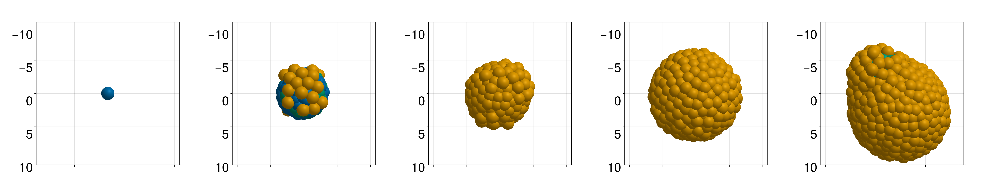

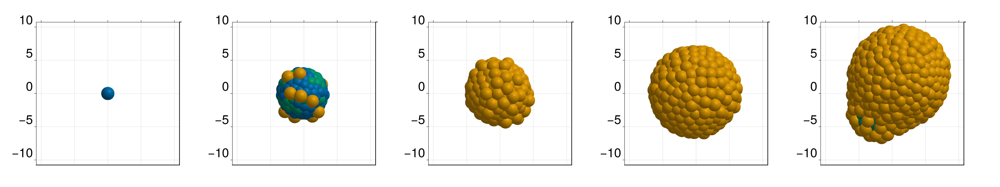

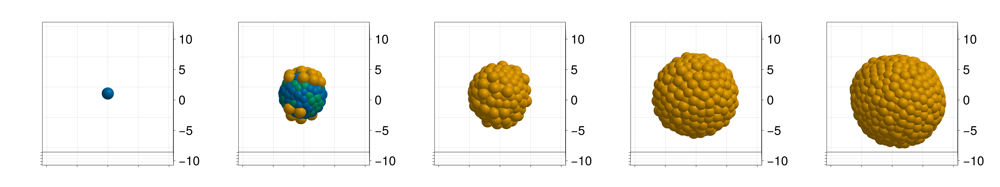

In [29]:
plot_pancake(com, colorMapNum, 1, length(com); n=5)

┌ Warning: Found `resolution` in the theme when creating a `Scene`. The `resolution` keyword for `Scene`s and `Figure`s has been deprecated. Use `Figure(; size = ...` or `Scene(; size = ...)` instead, which better reflects that this is a unitless size and not a pixel resolution. The key could also come from `set_theme!` calls or related theming functions.
└ @ Makie ~/.julia/packages/Makie/p9K7f/src/scenes.jl:264


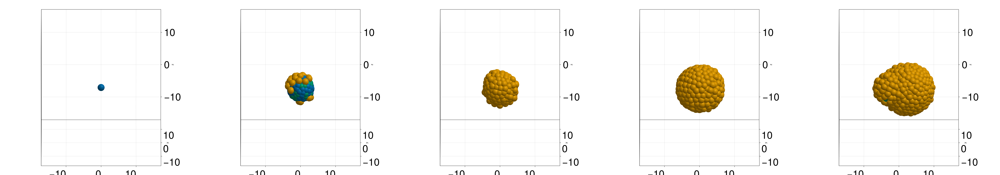

GLMakie.Screen(...)

In [30]:
_size_ = ((maximum(com.x) - minimum(com.x)) + com.r[1]) / 1.0
_every_ = 4

fig = Figure(resolution=(5000,1000))
labelsize = 50

# DECIDE IF TO COLOUR ACCORDING TO CELL FATE OR AGGREGATE:
if Colour_according_to_cell_fate == 1
    d = getParameter(com,[:x,:y,:z,:r,:cellFate])
else
    d = getParameter(com,[:x,:y,:z,:r,:cell_aggregate])
end

for (i,pos) in enumerate([1:round(Int64,length(com)/_every_):length(com);length(com)])
    ax = Axis3(fig[1,i],
        xticklabelsize = labelsize,
		yticklabelsize = labelsize,
		zticklabelsize = labelsize,
        aspect = :data, 
        azimuth = 1.5 * pi)

    if Colour_according_to_cell_fate == 1
        color = [colorMapNum[i] for i in d[:cellFate][pos]]
    else
        color = [colorMapNum[i] for i in d[:cell_aggregate][pos]]
    end

    meshscatter!(ax,d[:x][pos],d[:y][pos],d[:z][pos],markersize=d[:r][pos],color=color)
    xlims!(ax,-_size_,_size_)
    ylims!(ax,-_size_,_size_)
    zlims!(ax,-_size_,_size_)
end

display(fig)

┌ Warning: Found `resolution` in the theme when creating a `Scene`. The `resolution` keyword for `Scene`s and `Figure`s has been deprecated. Use `Figure(; size = ...` or `Scene(; size = ...)` instead, which better reflects that this is a unitless size and not a pixel resolution. The key could also come from `set_theme!` calls or related theming functions.
└ @ Makie ~/.julia/packages/Makie/p9K7f/src/scenes.jl:264


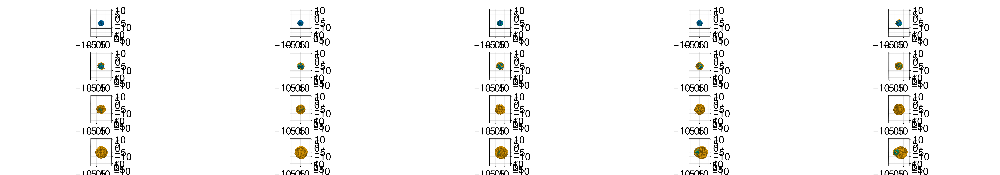

In [31]:
_size_ = ((maximum(com.x) - minimum(com.x)) + com.r[1]) / 1.5
_every_ = 23
_azimuth_ = 1.5
_elevation_ = 0.5
labelsize = 50

fig = Figure(resolution=(5000, 4000))  # Create a larger figure

# Function to add subplots
function add_subplot(row, d, range)
    for (i, pos) in enumerate(range)
        ax = Axis3(fig[row, i], 
            xticklabelsize = labelsize,
            yticklabelsize = labelsize,
            zticklabelsize = labelsize,
            aspect = :data, 
            azimuth = _azimuth_ * π,
        )

        # Corrected color mapping
        if Colour_according_to_cell_fate == 1
            color = [colorMapNum[i] for i in d[:cellFate][pos]]
        else
            color = [colorMapNum[i] for i in d[:cell_aggregate][pos]]
        end

        meshscatter!(ax, d[:x][pos], d[:y][pos], d[:z][pos], markersize=d[:r][pos]*0.5, color=color)
        xlims!(ax, -_size_, _size_)
        ylims!(ax, -_size_, _size_)
        zlims!(ax, -_size_, _size_)
    end
end

# Load data
if Colour_according_to_cell_fate == 1
    d = getParameter(com, [:x, :y, :z, :r, :cellFate])
else
    d = getParameter(com, [:x, :y, :z, :r, :cell_aggregate])
end

# Add the four rows of subplots
add_subplot(1, d, 1+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):round(Int64, length(com)/4))
add_subplot(2, d, round(Int64, length(com)/4)+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):round(Int64, length(com)/4*2))
add_subplot(3, d, round(Int64, length(com)/4*2)+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):round(Int64, length(com)/4*3))
add_subplot(4, d, round(Int64, length(com)/4*3)+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):length(com))

# Display and save
display(fig)
save("z_snapshots_1.png", fig)

┌ Warning: Found `resolution` in the theme when creating a `Scene`. The `resolution` keyword for `Scene`s and `Figure`s has been deprecated. Use `Figure(; size = ...` or `Scene(; size = ...)` instead, which better reflects that this is a unitless size and not a pixel resolution. The key could also come from `set_theme!` calls or related theming functions.
└ @ Makie ~/.julia/packages/Makie/p9K7f/src/scenes.jl:264


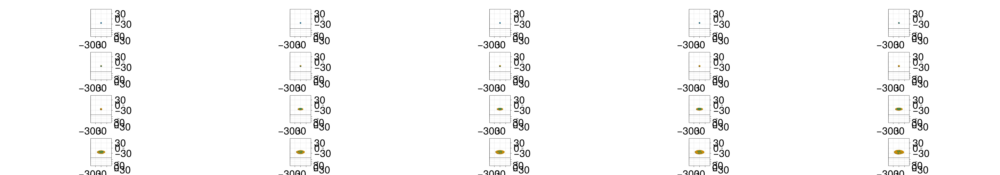

In [ ]:
_size_ = ((maximum(com.x) - minimum(com.x)) + com.r[1]) / 1.0
_every_ = 23
_azimuth_ = 1.5
labelsize = 50

fig = Figure(resolution=(5000, 4000))  # Create a larger figure

# Function to add subplots
function add_subplot(row, d, range)
    for (i, pos) in enumerate(range)
        ax = Axis3(fig[row, i], 
            xticklabelsize = labelsize,
            yticklabelsize = labelsize,
            zticklabelsize = labelsize,
            azimuth = _azimuth_ * π,
            aspect = :data)

        # Corrected color mapping
        if Colour_according_to_cell_fate == 1
            color = [colorMapNum[i] for i in d[:cellFate][pos]]
        else
            color = [colorMapNum[i] for i in d[:cell_aggregate][pos]]
        end

        meshscatter!(ax, d[:x][pos], d[:y][pos], d[:z][pos], markersize=d[:r][pos], color=color)
        xlims!(ax, -_size_, _size_)
        ylims!(ax, -_size_, _size_)
        zlims!(ax, -_size_, _size_)
    end
end

# Load data
if Colour_according_to_cell_fate == 1
    d = getParameter(com, [:x, :y, :z, :r, :cellFate])
else
    d = getParameter(com, [:x, :y, :z, :r, :cell_aggregate])
end

# Add the four rows of subplots
add_subplot(1, d, 1+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):round(Int64, length(com)/4))
add_subplot(2, d, round(Int64, length(com)/4)+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):round(Int64, length(com)/4*2))
add_subplot(3, d, round(Int64, length(com)/4*2)+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):round(Int64, length(com)/4*3))
add_subplot(4, d, round(Int64, length(com)/4*3)+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):length(com))

# Display and save
display(fig)
save("z_snapshots_2.png", fig)

### Make directory for saving output files 



In [ ]:
dir_name = "z_results"
mkpath(dir_name)

### Segregation score & Polarisation



In [ ]:
t0 = 38.36
tf = steps * dt
t_scale = 4 / 60 #mins

In [ ]:
d2 = getParameter(com,[:x,:y,:z,:cellFate,:z_plate_height,:z_substrate_height]);
d2[:cellFate];
df = DataFrame(d2)  # Convert Dict to DataFrame
df[!,1];
typeof(df[!,1])
size(df[!,5])
last(df, 5)  # preview last 5 rows
df

In [ ]:
using DataFrames, CSV

# Arrays to store flattened cell data
times_expanded = Int[]
x_expanded = Float64[]
y_expanded = Float64[]
z_expanded = Float64[]
fate_expanded = Int[]
z_plate_height_expanded = Float64[]
z_substrate_height_expanded = Float64[]

# Array to store plate positions (one per timestep)
plate_times = Int[]
plate_heights = Float64[]
substrate_heights = Float64[]

for (i, row) in enumerate(eachrow(df))
    # Flatten cells
    for j in eachindex(row.x)
        push!(times_expanded, i)
        push!(x_expanded, row.x[j])
        push!(y_expanded, row.y[j])
        push!(z_expanded, row.z[j])
        push!(fate_expanded, row.cellFate[j])
        push!(z_plate_height_expanded, row.z_plate_height[1])
        push!(z_substrate_height_expanded, row.z_substrate_height[1])
    end

    # Record plate position once per timestep
    push!(plate_times, i)
    push!(plate_heights, row.z_plate_height[1])
    push!(substrate_heights, row.z_substrate_height[1])
end

# Create DataFrame for cells
cells_flat_df = DataFrame(
    t = times_expanded,
    x = x_expanded,
    y = y_expanded,
    z = z_expanded,
    cellFate = fate_expanded,
)

# Create DataFrame for plate positions
plate_df = DataFrame(
    t = plate_times,
    z_plate_height = plate_heights,
    z_substrate_height = substrate_heights,
)

# Save CSVs
CSV.write("$dir_name/cells_flat.csv", cells_flat_df)
CSV.write("$dir_name/plate_positions.csv", plate_df)

#### Segregation score —— New



In [ ]:
# --- Function to compute per-cell segregation scores at a given timestep ---
function per_cell_segregation_scores(com, t; cutoff = 2.0)
    d = getParameter(com, [:x, :y, :z, :cellFate])
    x, y, z, fates = d[:x][t], d[:y][t], d[:z][t], d[:cellFate][t]
    N = length(x)

    scores = Float64[]
    fate_scores = Dict{Int, Vector{Float64}}()

    for i in 1:N
        pi = @SVector [x[i], y[i], z[i]]
        fi = fates[i]

        same_fate = 0
        total_neighbors = 0

        for j in 1:N
            if i == j
                continue
            end
            pj = @SVector [x[j], y[j], z[j]]
            if euclidean(pi, pj) < cutoff
                total_neighbors += 1
                same_fate += (fates[j] == fi) ? 1 : 0
            end
        end

        score = total_neighbors > 0 ? same_fate / total_neighbors : 0.0
        push!(scores, score)
        push!(get!(fate_scores, fi, Float64[]), score)
    end

    return scores, fate_scores
end

In [ ]:
# --- Loop over time to collect segregation scores ---
timesteps = 1:length(com)
mean_scores = Float64[]
std_scores = Float64[]

fate_scores = Dict{Int, Vector{Float64}}()
fate_stds = Dict{Int, Vector{Float64}}()

for (t_idx, t) in enumerate(timesteps)
    scores, scores_by_fate = per_cell_segregation_scores(com, t; cutoff = 2.0)

    # Whole system
    push!(mean_scores, mean(scores))
    push!(std_scores, std(scores))

    # Collect all fates seen so far
    all_fates = union(keys(fate_scores), keys(scores_by_fate))

    for fate in all_fates
        # Handle new fates by padding with NaNs
        if !haskey(fate_scores, fate)
            fate_scores[fate] = fill(NaN, t_idx - 1)
            fate_stds[fate] = fill(NaN, t_idx - 1)
        end

        if haskey(scores_by_fate, fate)
            fs = scores_by_fate[fate]
            push!(fate_scores[fate], mean(fs))
            push!(fate_stds[fate], std(fs))
        else
            push!(fate_scores[fate], NaN)
            push!(fate_stds[fate], NaN)
        end
    end
end

In [ ]:
using GLMakie, LaTeXStrings

# --- Plotting ---
sim_start_time = t0
x_lim_min = t0
x_lim_max = tf + 5
fontsize = 32

## Compute tick positions (on the original x scale)

## Convert them to hours for labels, then to LaTeXStrings

# Compute tick positions (on the original x scale)
xtick_positions = range(x_lim_min, x_lim_max; length=6)

# Set t0 as reference time: the tick closest to it should be labeled 0.0
xtick_labels = round.(((xtick_positions .- t0) .* t_scale); digits=1)

# Replace -0.0 with 0.0
xtick_labels = map(x -> x == -0.0 ? 0.0 : x, xtick_labels)

xtick_labels_latex = [latexstring(string(val)) for val in xtick_labels]

# Y-ticks, for example 0 to 1.2 in 5 steps, all LaTeXStrings
ytick_positions = range(0, 1.2; length=5)
ytick_labels_latex = [latexstring(string(round(val, digits=2))) for val in ytick_positions]

fig = Figure(resolution = (1000, 625))
ax = Axis(fig[1, 1],
    xlabel = L"Time \,\; (h)",
    ylabel = L"Segregation \,\, Score",
    xlabelsize = fontsize-2,
    ylabelsize = fontsize-2,
    titlesize = fontsize+4,
    xticks = (xtick_positions, xtick_labels_latex),
    yticks = (ytick_positions, ytick_labels_latex),
    xticklabelsize = fontsize,
    yticklabelsize = fontsize,
    xgridvisible = false,
    ygridvisible = false,
    ylabelpadding = 10,  # <-- increase this number as needed
    xlabelpadding = 10,  # <-- increase this number as needed
)

# Add empty slot in second column to add spacing
fig[1, 2] = GridLayout()  # acts like a blank spacer
colsize!(fig.layout, 2, Relative(0.05))

ylims!(ax, 0, 1.2)
xlims!(ax, x_lim_min, x_lim_max)

# Overall system curve (black)

# Example plotting loop, make sure you define `fate_scores`, `fate_stds`, `timesteps` somewhere
colors = [:blue, :green, :orange, :yellow, :purple, :teal, :brown, :red]
color_keys = sort(collect(keys(fate_scores)))

for (i, fate) in enumerate(color_keys)
    if i == 1  # skip the first fate (blue line)
        continue
    end
    color = colors[mod1(i, length(colors))]
    fs = fate_scores[fate]
    stds = fate_stds[fate]

    band!(ax, timesteps, fs .- stds, fs .+ stds; color = (color, 0.2))
    lines!(ax, timesteps, fs; color = color, linewidth = 2, label = "Fate $fate")
end

fig
display(fig)
save("z_segregation_score_per_fate.png", fig; px_per_unit = 4)

In [ ]:
using CSV, DataFrames

combined_df = DataFrame(timestep = Int[], fate = String[], mean_score = Float64[], std_score = Float64[])

# Add global data
for (i, t) in enumerate(timesteps)
    push!(combined_df, (t, "all", mean_scores[i], std_scores[i]))
end

# Add fate-specific data
for (fate, scores) in fate_scores
    stds = fate_stds[fate]
    for (i, t) in enumerate(timesteps)
        push!(combined_df, (t, string(fate), scores[i], stds[i]))
    end
end

CSV.write("$dir_name/segregation_scores_combined.csv", combined_df)

In [ ]:
using DataFrames

# Filter combined_df to get only mean segregation scores (not std)
mean_df = combined_df[:, [:timestep, :fate, :mean_score]]

# Pivot the table so that each fate becomes a column
wide_df = unstack(mean_df, :fate, :mean_score)

# Optionally rename columns for clarity
rename!(wide_df, Dict(
    "all" => "score_all",
    "1" => "score_1",
    "2" => "score_2",
    "3" => "score_3"
))

# Sort by timestep just in case
sort!(wide_df, :timestep)

# Save to CSV (optional)
CSV.write("z_results/segregation_scores_wide.csv", wide_df)

#### Polarisation



In [ ]:
min_cluster_size = 30
cutoff = 1.5

In [ ]:
using DataFrames, LinearAlgebra, Distances, StaticArrays, Statistics

function biggest_cluster_com_2(
    df::DataFrame, 
    timestep::Int, 
    fate_value::Int, 
    cutoff::Float64, 
    min_cluster_size::Int = 1
)

    cellfates = df[timestep, 1]
    x = df[timestep, 2]
    y = df[timestep, 3]
    z = df[timestep, 4]

    global_com = (
        x = mean(x),
        y = mean(y),
        z = mean(z)
    )

    idxs = findall(f -> f == fate_value, cellfates)
    if isempty(idxs)
        return (
            cluster_com = (x = 0.0, y = 0.0, z = 0.0),
            global_com = global_com,
            relative_com = (x = 0.0, y = 0.0, z = 0.0),
            cluster_size = 0
        )
    end

    # Coordinates of selected particles
    coords = [SVector(x[i], y[i], z[i]) for i in idxs]

    n = length(coords)
    visited = falses(n)
    clusters = Vector{Vector{Int}}()

    for i in 1:n
        if visited[i]
            continue
        end
        neighbors = [j for j in 1:n if euclidean(coords[i], coords[j]) <= cutoff]
        if length(neighbors) > 1
            cluster = Set(neighbors)
            new_members = Set(neighbors)
            while !isempty(new_members)
                current = pop!(new_members)
                visited[current] = true
                next_neighbors = [j for j in 1:n if euclidean(coords[current], coords[j]) <= cutoff && !(j in cluster)]
                foreach(j -> push!(new_members, j), next_neighbors)
                union!(cluster, next_neighbors)
            end
            push!(clusters, collect(cluster))
        else
            visited[i] = true
        end
    end

    if isempty(clusters)
        return (
            cluster_com = (x = 0.0, y = 0.0, z = 0.0),
            global_com = global_com,
            relative_com = (x = 0.0, y = 0.0, z = 0.0),
            cluster_size = 0
        )
    end

    largest = argmax(length.(clusters))
    cluster_indices = clusters[largest]
    size_largest = length(cluster_indices)

    if size_largest < min_cluster_size
        return (
            cluster_com = (x = 0.0, y = 0.0, z = 0.0),
            global_com = global_com,
            relative_com = (x = 0.0, y = 0.0, z = 0.0),
            cluster_size = size_largest
        )
    end

    original_idxs = idxs[cluster_indices]
    cluster_com = (
        x = mean(x[original_idxs]),
        y = mean(y[original_idxs]),
        z = mean(z[original_idxs])
    )

    relative_com = (
        x = cluster_com.x - global_com.x,
        y = cluster_com.y - global_com.y,
        z = cluster_com.z - global_com.z
    )

    return (
        cluster_com = cluster_com,
        global_com = global_com,
        relative_com = relative_com,
        cluster_size = size_largest
    )
end

In [ ]:
# FORMAT: biggest_cluster_com(df, timestep, cellFate, cutoff, Nmin):
result = biggest_cluster_com_2(df, 350, 2, 2.0, 300)

println("Cluster COM: ", result.cluster_com)
println("Global COM: ", result.global_com)
println("Relative COM: ", result.relative_com)
println("COM cluster size: ", result.cluster_size)

In [ ]:
function compute_com_series_2(df::DataFrame, fate_value::Int, cutoff::Float64, min_cluster_size::Int = 1)
    results = []

    for t in 1:size(df, 1)
        result = biggest_cluster_com_2(df, t, fate_value, cutoff, min_cluster_size)

        push!(results, (
            timestep = t,
            cluster_x = result.cluster_com.x,
            cluster_y = result.cluster_com.y,
            cluster_z = result.cluster_com.z,
            global_x = result.global_com.x,
            global_y = result.global_com.y,
            global_z = result.global_com.z,
            rel_x = result.relative_com.x,
            rel_y = result.relative_com.y,
            rel_z = result.relative_com.z,
            cluster_size = result.cluster_size,
            rel_dist = norm([
                result.relative_com.x,
                result.relative_com.y,
                result.relative_com.z
            ])
        ))
    end

    df_result = DataFrame(results)

    # Compute normalized norm (skip negative marker values)
    valid_norms = filter(!isnan, filter(x -> x ≥ 0, df_result.rel_dist))
    max_norm = isempty(valid_norms) ? NaN : maximum(valid_norms)

    df_result.rel_dist_norm = if isnan(max_norm) || max_norm == 0
        fill(NaN, size(df_result, 1))
    else
        [r ≥ 0 ? r / max_norm : r for r in df_result.rel_dist]
    end

    return df_result
end

In [ ]:
cell_fate = 2
# FORMAT: compute_com_series(df, cellFate, cutoff, min_cluster_size):
df_com_series = compute_com_series_2(df, cell_fate, cutoff, min_cluster_size)

last(df_com_series, 5)  # preview last 5 rows

In [ ]:
using GLMakie, DataFrames, LaTeXStrings

sim_start_time = t0
x_lim_min = t0
x_lim_max = tf + 5

function plot_relative_com_evolution_2(com_df::DataFrame; normalized=true, min_cluster_size=min_cluster_size, fontsize=30, padding_frac=0.05)
    rel_dist_col = normalized ? :rel_dist_norm : :rel_dist
    valid_mask = com_df[!, rel_dist_col] .> 0
    cluster_sizes = com_df.cluster_size

    min_size = isnothing(min_cluster_size) ? minimum(cluster_sizes) : min_cluster_size
    max_size = maximum(cluster_sizes)
    norm_sizes = max_size > min_size ? (cluster_sizes .- min_size) ./ (max_size - min_size) : fill(0.5, length(cluster_sizes))
    cmap = :viridis

    x_valid = com_df.timestep[valid_mask]
    y_valid = com_df[valid_mask, rel_dist_col]
    c_valid = norm_sizes[valid_mask]

    # X-axis: first and last tick exactly at data boundaries + 2 intermediate ticks
    xmin_data = minimum(x_valid)
    xmax_data = maximum(x_valid)
    xrange = xmax_data - xmin_data

    first_tick = xmin_data
    last_tick = xmax_data
    n_intermediate = 2

    intermediate_ticks = collect(range(first_tick, last_tick; length=n_intermediate + 2))[2:end-1]
    xtick_positions = vcat(first_tick, intermediate_ticks, last_tick)
    xtick_labels = round.(((xtick_positions .- t0) .* t_scale); digits=1)
    xtick_labels_latex = [latexstring(string(val)) for val in xtick_labels]

    xmin_padded = xmin_data - padding_frac * xrange
    xmax_padded = xmax_data + padding_frac * xrange

    # Y-axis: first tick exactly zero, padding only on top
    y_min = 0
    y_max = maximum(y_valid)
    y_range = y_max - y_min
    y_max_padded = y_max + padding_frac * y_range

    n_yticks = 5
    y_tick_positions = range(y_min, y_max_padded; length=n_yticks)
    y_tick_labels_latex = [latexstring(string(round(val, digits=2))) for val in y_tick_positions]

    fig = Figure(resolution = (900, 600))
    ax = Axis(fig[1, 1],
        xlabel = L"Time \, (h)",
        ylabel = normalized ? L"Normalized \, Relative \, COM \, Distance" : L"Relative \, COM \, Distance \,\; (r)",
        xlabelsize = fontsize,
        ylabelsize = fontsize,
        titlesize = fontsize + 4,
        xticklabelsize = fontsize - 2,
        yticklabelsize = fontsize - 2,
        xticks = (xtick_positions, xtick_labels_latex),
        yticks = (y_tick_positions, y_tick_labels_latex),
        ylabelpadding = 10,  # <-- increase this number as needed
        xlabelpadding = 10,  # <-- increase this number as needed
    )
    ax.xgridvisible = false
    ax.ygridvisible = false

    xlims!(ax, xmin_padded, xmax_padded)
    ylims!(ax, y_min, y_max_padded)

    scatter!(ax, x_valid, y_valid, color = c_valid, colormap = cmap, markersize = 12)

    cb_ticks = round.(Int, range(min_size, max_size; length=3))
    cb_tick_labels_latex = [latexstring(string(val)) for val in cb_ticks]

    cb = Colorbar(fig[1, 2],
        colormap = cmap,
        limits = (min_size, max_size),
        label = L"Cluster \, Size \,\; (cells)",
        labelsize = fontsize,
        ticklabelsize = fontsize,
        ticks = (cb_ticks, cb_tick_labels_latex),
        width = 20,
        height = Relative(1),
        labelpadding = 10,  # Increase this to add more space
    )

    return fig
end

In [ ]:
fig = plot_relative_com_evolution_2(df_com_series; normalized=false, min_cluster_size)
display(fig)
save("z_colored_relative_com_evolution.png", fig)

In [ ]:
function plot_relative_com_evolution(com_df::DataFrame; normalized=true)
    # Choose data column
    rel_dist_col = normalized ? :rel_dist_norm : :rel_dist

    # Logical masks
    valid_mask = com_df[!, rel_dist_col] .> 0
    invalid_mask = .!valid_mask

    # Start a figure
    fig = Figure(resolution = (800, 500))
    ax = Axis(fig[1, 1], 
        xlabel = "Time step",
        ylabel = normalized ? "Normalized Relative COM Distance" : "Relative COM Distance",
        title = "Temporal Evolution of Relative Distance"
    )

    xlims!(ax, t0, tf)

    # Plot valid values
    lines!(ax, com_df.timestep[valid_mask], com_df[valid_mask, rel_dist_col],
        color = :dodgerblue,
        linewidth = 2,
        label = "Valid"
    )

    # Mark invalid values
    scatter!(ax, com_df.timestep[invalid_mask], com_df[invalid_mask, rel_dist_col],
        color = :red,
        marker = :x,
        markersize = 8,
        label = "Invalid or Missing"
    )

    axislegend(ax; position = :lt)
    fig
end

In [ ]:
fig = plot_relative_com_evolution(df_com_series, normalized=false)
display(fig)
save("z_com_evolution.png", fig)  # Save to file if you want

In [ ]:
function get_largest_cluster_diameter(
    df::DataFrame, 
    fate_value::Int, 
    cutoff::Float64, 
    min_cluster_size::Int = 1;
    t_start::Int = 1  # default to the first timepoint
)
    max_cluster_diameter = 0.0
    system_diameter = 0.0

    for t in 1:size(df, 1)
        # Extract relevant particles
        cellfates = df[t, 1]
        x = df[t, 2]
        y = df[t, 3]
        z = df[t, 4]

        idxs = findall(f -> f == fate_value, cellfates)
        if isempty(idxs)
            continue
        end

        coords = [SVector(x[i], y[i], z[i]) for i in idxs]
        n = length(coords)
        visited = falses(n)
        clusters = Vector{Vector{Int}}()

        for i in 1:n
            if visited[i]
                continue
            end
            neighbors = [j for j in 1:n if euclidean(coords[i], coords[j]) ≤ cutoff]
            if length(neighbors) > 1
                cluster = Set(neighbors)
                new_members = Set(neighbors)
                while !isempty(new_members)
                    current = pop!(new_members)
                    visited[current] = true
                    next_neighbors = [j for j in 1:n if euclidean(coords[current], coords[j]) ≤ cutoff && !(j in cluster)]
                    foreach(j -> push!(new_members, j), next_neighbors)
                    union!(cluster, next_neighbors)
                end
                push!(clusters, collect(cluster))
            else
                visited[i] = true
            end
        end

        if !isempty(clusters)
            largest = argmax(length.(clusters))
            cluster_indices = clusters[largest]

            if length(cluster_indices) ≥ min_cluster_size
                points = [coords[i] for i in cluster_indices]
                d = maximum(pairwise(Euclidean(), points))
                max_cluster_diameter = max(max_cluster_diameter, d)
            end
        end
    end

    # Compute system-wide diameter at t_start
    x_all = df[t_start, 2]
    y_all = df[t_start, 3]
    z_all = df[t_start, 4]
    coords_all = [SVector(x_all[i], y_all[i], z_all[i]) for i in 1:length(x_all)]
    system_diameter = maximum(pairwise(Euclidean(), coords_all))

    return max_cluster_diameter, system_diameter
end

In [ ]:
cell_fate = 2
cluster_d, system_d = get_largest_cluster_diameter(df, cell_fate, cutoff, min_cluster_size; t_start = Int64(ceil(t0+5)))
println("Cluster diameter: ", cluster_d)
println("System diameter at t=50: ", system_d)

In [ ]:
cell_fate_main = 2 # CellFate we are interested in
cell_fate_ref = 3 # Size of largest cluster of given cellFate to be used as normalisation factor for distance

max_cluster_size = system_d

# Run normal computation
df_com_series_2 = compute_com_series_norm_diameter(df, cell_fate_main, cutoff, min_cluster_size)

df_com_series_2.rel_dist_norm = if isnan(max_cluster_size) || max_cluster_size == 0
    fill(NaN, size(df_com_series_2, 1))
else
    [r ≥ 0 ? r / max_cluster_size : r for r in df_com_series_2.rel_dist]
end;

last(df_com_series_2, 5)  # preview last 5 rows

In [ ]:
fig = plot_relative_com_evolution_2(df_com_series_2, normalized=true)
display(fig)
save("z_colored_normalised_relative_com_evolution.png", fig)

In [ ]:
fig = plot_relative_com_evolution(df_com_series_2, normalized=true)
display(fig)
save("z_relative_com_evolution.png", fig)  # Save to file if you want

In [ ]:
using GLMakie, DataFrames, LaTeXStrings

function plot_com_with_dual_yaxes(com_df::DataFrame; 
        min_cluster_size=min_cluster_size, fontsize=30, padding_frac=0.05)

    # Columns for normalized and raw distances
    normalized_col = :rel_dist_norm
    raw_col = :rel_dist

    # Filter valid data points (only those with positive normalized distance)
    valid_mask = com_df[!, normalized_col] .> 0

    # Cluster size and color normalization
    cluster_sizes = com_df.cluster_size
    min_size = isnothing(min_cluster_size) ? minimum(cluster_sizes) : min_cluster_size
    max_size = maximum(cluster_sizes)
    norm_sizes = max_size > min_size ? (cluster_sizes .- min_size) ./ (max_size - min_size) : fill(0.5, length(cluster_sizes))
    cmap = :viridis

    # Extract valid data for plotting
    x_valid = com_df.timestep[valid_mask]
    y_norm = com_df[valid_mask, normalized_col]
    y_raw = com_df[valid_mask, raw_col]
    c_valid = norm_sizes[valid_mask]

    # X axis ticks and padding (same as original)
    xmin_data, xmax_data = minimum(x_valid), maximum(x_valid)
    xrange = xmax_data - xmin_data
    first_tick, last_tick = xmin_data, xmax_data
    intermediate_ticks = collect(range(first_tick, last_tick; length=4))[2:end-1]
    xtick_positions = vcat(first_tick, intermediate_ticks, last_tick)
    xtick_labels = round.(((xtick_positions .- t0) .* t_scale); digits=1)
    xtick_labels_latex = [latexstring(string(val)) for val in xtick_labels]

    xmin_padded = xmin_data - padding_frac * xrange
    xmax_padded = xmax_data + padding_frac * xrange

    # Y axis limits and ticks for normalized values (left axis)
    y_norm_min = 0
    y_norm_max = maximum(y_norm)
    y_norm_range = y_norm_max - y_norm_min
    y_norm_max_padded = y_norm_max + padding_frac * y_norm_range
    n_yticks = 5
    y_norm_ticks = range(y_norm_min, y_norm_max_padded; length=n_yticks)
    y_norm_labels = [latexstring(string(round(val, digits=2))) for val in y_norm_ticks]

    # Y axis limits and ticks for raw values (right axis)
    y_raw_min = 0
    y_raw_max = maximum(y_raw)
    y_raw_range = y_raw_max - y_raw_min
    y_raw_max_padded = y_raw_max + padding_frac * y_raw_range
    y_raw_ticks = range(y_raw_min, y_raw_max_padded; length=n_yticks)
    y_raw_labels = [latexstring(string(round(val, digits=2))) for val in y_raw_ticks]

    # Create figure and left axis (normalized y-axis)
    fig = Figure(resolution = (900, 600))
    ax_left = Axis(fig[1, 1],
        xlabel = L"Time \, (h)",
        ylabel = L"Normalized \, Relative \, COM \, Distance",
        xlabelsize = fontsize,
        ylabelsize = fontsize,
        xticks = (xtick_positions, xtick_labels_latex),
        yticks = (y_norm_ticks, y_norm_labels),
        xticklabelsize = fontsize - 2,
        yticklabelsize = fontsize - 2,
        ylabelpadding = 10,
        xlabelpadding = 10,
    )
    ax_left.xgridvisible = false
    ax_left.ygridvisible = false
    xlims!(ax_left, xmin_padded, xmax_padded)
    ylims!(ax_left, y_norm_min, y_norm_max_padded)

    # Scatter plot on left axis
    scatter!(ax_left, x_valid, y_norm, color = c_valid, colormap = cmap, markersize = 12)

    # Create right axis sharing the x axis with ax_left
    ax_right = Axis(fig[1, 1], 
        ylabel = L"Relative \, COM \, Distance \, (r)",
        ylabelsize = fontsize,
        yticklabelsize = fontsize - 2,
        yticks = (y_raw_ticks, y_raw_labels),
        yaxisposition = :right,
        xticksvisible = false,  # Hide x ticks on right axis
        ygridvisible = false,
        backgroundcolor = (:transparent),
    )
    ax_right.xticksvisible = false
    ax_right.xticks = ([], [])
    ax_right.xlabelvisible = false
    ax_right.xlabelvisible = false
    ax_right.xgridvisible = false  # optional, if you want no grid lines on top

    xlims!(ax_right, xmin_padded, xmax_padded)
    ylims!(ax_right, y_raw_min, y_raw_max_padded)

    # Make right axis transparent except for labels
    hidespines!(ax_right, :l, :t, :b)  # your spine hiding as before
    ax_right.xticksvisible = false     # hide x ticks on secondary axis
    ax_right.xlabelvisible = false     # hide x label on secondary axis
    ax_right.xgridvisible = false      # hide x grid on secondary axis (optional)

    # Add colorbar (optional) on the right side outside axes
    cb_ticks = round.(Int, range(min_size, max_size; length=3))
    cb_tick_labels = [latexstring(string(val)) for val in cb_ticks]

    cb = Colorbar(fig[1, 2],
        colormap = cmap,
        limits = (min_size, max_size),
        label = L"Cluster \, Size \,\; (cells)",
        labelsize = fontsize,
        ticklabelsize = fontsize,
        ticks = (cb_ticks, cb_tick_labels),
        width = 20,
        height = Relative(1),
        labelpadding = 10,
    )

    return fig
end

In [ ]:
fig = plot_com_with_dual_yaxes(df_com_series_2)
display(fig)
save("z_com_dual_axis_plot.png", fig)

#### Save cluster COM dataframe to file



In [ ]:
CSV.write("$dir_name/cluster_com_series.csv", df_com_series_2)

#### Plot COM of Largest cluster of B-type cells 



In [ ]:
# DECIDE IF TO COLOUR ACCORDING TO CELL FATE OR AGGREGATE:
# FOR COLOURING ACCORDING TO CELL FATE:
if Colour_according_to_cell_fate == 1
    colorMapNum = Dict(1=>(Makie.wong_colors()[1],0.1),2=>(Makie.wong_colors()[3],1.0),3=>(Makie.wong_colors()[2],0.1));
# FOR COLOURING ACCORDING TO AGGREGATE:
else  
    colorMapNum = Dict(1=>(Makie.wong_colors()[5],1.0),2=>(Makie.wong_colors()[4],1.0),3=>(Makie.wong_colors()[7],1.0),4=>(Makie.wong_colors()[6],1.0));
end

In [ ]:
_size_ = ((maximum(com.x) - minimum(com.x)) + com.r[1]) / 1.5
_every_ = 23
_azimuth_ = 0.0
labelsize = 50

fig = Figure(resolution=(5000, 4000))  # Create a larger figure

function add_subplot(row, d, range; cellFateOfInterest::Int, cutoff::Float64 = 5.0, min_cluster_size::Int = 1)
    for (i, pos) in enumerate(range)
        ax = Axis3(fig[row, i], 
            xticklabelsize = labelsize,
            yticklabelsize = labelsize,
            zticklabelsize = labelsize,
            aspect = :data, 
            azimuth = _azimuth_ * π)

        # Color particles by cell fate or aggregate
        if Colour_according_to_cell_fate == 1
            color = [colorMapNum[i] for i in d[:cellFate][pos]]
        else
            color = [colorMapNum[i] for i in d[:cell_aggregate][pos]]
        end

        # Plot particles
        meshscatter!(ax, d[:x][pos], d[:y][pos], d[:z][pos], 
                     markersize=d[:r][pos] ./ 2.0, color=color)

        # Create a mini dataframe for this timestep
        df_t = DataFrame(
            cellFate = [d[:cellFate][pos]],
            x = [d[:x][pos]],
            y = [d[:y][pos]],
            z = [d[:z][pos]],
        )

        # Compute COM of largest cluster of given fate
        result = biggest_cluster_com(df_t, 1, cellFateOfInterest, cutoff, min_cluster_size)
        com = result.cluster_com

        # If valid COM, draw it as a red star

        if com != (x = 0.0, y = 0.0, z = 0.0)
            scatter!(ax, [com.x], [com.y], [com.z]; 
            color = :red, marker = :star5, markersize = 40,
            overdraw = true, depth_shift = -1e-3)
        end

        # Set axis limits
        xlims!(ax, -_size_, _size_)
        ylims!(ax, -_size_, _size_)
        zlims!(ax, -_size_, _size_)
    end
end

# Add the four rows of subplots:

cellFateOfInterest = 2

add_subplot(1, d, 1+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):round(Int64, length(com)/4); 
            cellFateOfInterest=cellFateOfInterest, cutoff=cutoff, min_cluster_size=min_cluster_size)

add_subplot(2, d, 1+round(Int64, length(com)/4)+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):round(Int64, length(com)/4*2); 
            cellFateOfInterest=cellFateOfInterest, cutoff=cutoff, min_cluster_size=min_cluster_size)

add_subplot(3, d, 1+round(Int64, length(com)/4*2)+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):round(Int64, length(com)/4*3); 
            cellFateOfInterest=cellFateOfInterest, cutoff=cutoff, min_cluster_size=min_cluster_size)

add_subplot(4, d, 1+round(Int64, length(com)/4*3)+round(Int64, length(com)/_every_):round(Int64, length(com)/_every_):length(com); 
            cellFateOfInterest=cellFateOfInterest, cutoff=cutoff, min_cluster_size=min_cluster_size)

# Repeat for other rows...

# Add the four rows of subplots

# Display and save
display(fig)
save("z_snapshots_3.png", fig)

# Other things

### Make movie of simulation 1



In [ ]:
# MAKE MOVIE WITH CM OF COM & TRACKING OF CM OF COM:

function animate_cells(df::DataFrame, com; 
    framerate=15, filename="cells_animation.mp4", 
    cellFateOfInterest::Int=2, cutoff::Float64=5.0, min_cluster_size::Int=10)

    fig = Figure(resolution = (2000, 2000))
    ax = Axis3(fig[1, 1], aspect = :data)

    # Adjust axis limits based on your domain
    xlims!(ax, -10, 10)
    ylims!(ax, -10, 10)
    zlims!(ax, -10, 10)

    # Observables for cell rendering
    positions = Observable(Point3f0[])
    colors = Observable(RGBA[])
    sizes = Observable(Float32[])
    meshscatter!(ax, positions; color=colors, markersize=sizes)

    # Observables for cluster COM
    cluster_marker = Observable(Point3f0[])
    scatter!(ax, cluster_marker; color = :red, marker = :star5, markersize = 40)

    # Observable for trail
    com_trail = Observable(Point3f0[])
    lines!(ax, com_trail; color = :red, linewidth = 2)

    # Observables for arrows

    # Define colors for each cell fate
    c1 = Makie.wong_colors()[1]
    c2 = Makie.wong_colors()[3]
    c3 = Makie.wong_colors()[2]

    fate_colors = Dict(
        1 => RGBA(red(c1), green(c1), blue(c1), 0.1),
        2 => RGBA(red(c2), green(c2), blue(c2), 1.0),
        3 => RGBA(red(c3), green(c3), blue(c3), 0.1)
    )

    n_frames = size(df, 1)

    record(fig, filename, 1:n_frames; framerate=framerate) do t
        # Particle positions and properties
        x = df[!, :x][t]
        y = df[!, :y][t]
        z = df[!, :z][t]
        fates = df[!, :cellFate][t]
        r_t = com.r[t]
        r = isa(r_t, AbstractVector) ? r_t : fill(r_t, length(x))

        positions[] = Point3f0.(x, y, z)
        colors[] = [get(fate_colors, f, RGBA(0.5, 0.5, 0.5, 1.0)) for f in fates]
        sizes[] = Float32.(r) ./ 2.0

        # Create mini-DataFrame for this timestep
        df_t = DataFrame(
            cellFate = [df[!, :cellFate][t]],
            x = [df[!, :x][t]],
            y = [df[!, :y][t]],
            z = [df[!, :z][t]],
        )

        # Compute cluster COM and global COM
        result = biggest_cluster_com(df_t, 1, cellFateOfInterest, cutoff, min_cluster_size)
        cluster_com = result.cluster_com
        global_com = result.global_com

        if cluster_com != (x = 0.0, y = 0.0, z = 0.0)
            cpt = Point3f0(cluster_com.x, cluster_com.y, cluster_com.z)
            gpt = Point3f0(global_com.x, global_com.y, global_com.z)

            cluster_marker[] = [cpt]

            # Update trail (keep last 100 frames)
            push!(com_trail[], cpt)
            length(com_trail[]) > 100 && popfirst!(com_trail[])
            notify(com_trail)

        else
            cluster_marker[] = Point3f0[]
        end
    end
end

animate_cells(df, com; 
    filename="z_cells_animation_full.mp4", 
    cellFateOfInterest=2, 
    cutoff=cutoff, 
    min_cluster_size=min_cluster_size
)

### Make GIF of simulation 2



In [ ]:
function movie_frames(com, color_map, mstart, mstop;
    size = ((maximum(com.x) - minimum(com.x)) + com.r[1]) / 1.5,
    showtime = true,
    shownumbers = false,
    cellFateOfInterest::Int = 2,
    cutoff::Float64 = 2.0,
    min_cluster_size::Int = min_cluster_size,
    skip::Int = 1  # New parameter: default no skipping
)
    # Build the time indices with skipping
    time_indices = collect(mstart:skip:mstop)
    m = length(string(length(time_indices)))  # for filename padding

    d = getParameter(com, Colour_according_to_cell_fate == 1 ?
        [:x, :y, :z, :r, :cellFate] :
        [:x, :y, :z, :r, :cell_aggregate]
    )
    labelsize = 30
    plots = []

    com_trail_x = Float64[]
    com_trail_y = Float64[]
    com_trail_z = Float64[]

    for (i, pos) in enumerate(time_indices)
        pos = floor(Int, pos)
        t = round(com[pos].t, digits = 2)

        fig_gif = Figure(resolution = (800, 800))

        t_scaled = round((com[pos].t - t0) * (t_scale), digits=2)

        ax = Axis3(
            fig_gif[1, 1],
            aspect = :data,
            azimuth = _azimuth_ * π,
            xlabel = "", ylabel = "", zlabel = "",
            xticklabelsize = shownumbers ? labelsize : 0,
            yticklabelsize = shownumbers ? labelsize : 0,
            zticklabelsize = shownumbers ? labelsize : 0,
            xticksvisible = false,
            yticksvisible = false,
            zticksvisible = false,
            xgridvisible = false,
            ygridvisible = false,
            zgridvisible = false,
            xspinesvisible = false,
            yspinesvisible = false,
            zspinesvisible = false,
            titlevisible = showtime,
            titlealign = :center,
            titlegap = 12,
            titlesize = labelsize,
            title = L"t = %$(t_scaled) \, h",
        )

        color = [colorMapNum[i] for i in d[Colour_according_to_cell_fate == 1 ? :cellFate : :cell_aggregate][pos]]
        meshscatter!(ax, d[:x][pos], d[:y][pos], d[:z][pos],
                     markersize = d[:r][pos]/2.0, color = color)

        # Compute COM of largest cluster for current timestep
        df_t = DataFrame(
            cellFate = [d[:cellFate][pos]],
            x = [d[:x][pos]],
            y = [d[:y][pos]],
            z = [d[:z][pos]],
        )
        result = biggest_cluster_com(df_t, 1, cellFateOfInterest, cutoff, min_cluster_size)
        com_point = result.cluster_com

        if com_point != (x = 0.0, y = 0.0, z = 0.0)
            push!(com_trail_x, com_point.x)
            push!(com_trail_y, com_point.y)
            push!(com_trail_z, com_point.z)

            lines!(ax, com_trail_x, com_trail_y, com_trail_z;
                   color = :red, linewidth = 2)

            scatter!(ax, [com_point.x], [com_point.y], [com_point.z];
                     color = :red, marker = :star5, markersize = 40,
                     overdraw = true, depth_shift = -1e-3)
        end

        xlims!(ax, -size, size)
        ylims!(ax, -size, size)
        zlims!(ax, -size, size)

        push!(plots, fig_gif)

        formatted_i = lpad(string(i), m, '0')
        save("frame_$formatted_i.png", fig_gif)
    end
end

In [ ]:
color_map = Dict(1=>Makie.wong_colors()[5],2=>Makie.wong_colors()[4],3=>Makie.wong_colors()[7],4=>Makie.wong_colors()[6]);
# FOR COLOURING ACCORDING TO CELL FATE:
if Colour_according_to_cell_fate == 1
    colorMapNum = Dict(1=>(Makie.wong_colors()[1],1.0),3=>(Makie.wong_colors()[2],1.0),2=>(Makie.wong_colors()[3],1.0));
    # FOR CAIRO MAKIE:
# FOR COLOURING ACCORDING TO AGGREGATE:
else  
    colorMapNum = Dict(1=>(Makie.wong_colors()[5],1.0),2=>(Makie.wong_colors()[4],1.0),3=>(Makie.wong_colors()[7],1.0),4=>(Makie.wong_colors()[6],1.0));
end

_azimuth_ = 1.5
m1 = floor(t0)
m2 = length(com);
prop = 1
n_images = round(Int, prop * (m2 - m1))
movie_frames(
    com,
    color_map,
    m1,       # mstart
    m2,      # mstop
    skip = 1,  # Generate a frame every skip steps
    cellFateOfInterest = 2,
    cutoff = cutoff,
    min_cluster_size = min_cluster_size,
)
moment = Dates.format(now(), "dd-mm_yyyy");

In [ ]:
run(`magick "frame*".png -scale 800x800 z_movie.gif`)

### Proportions of aggregate types with time



In [ ]:
function get_props(com)

	d = getParameter(com, [:t, :cell_aggregate, :N])

	props = Dict()
	for state in 1:4  # 1=A, 2=B, 3=C
		props[state] = [sum(i .== state) for i in d[:cell_aggregate]]
		props[state] = props[state] ./ d[:N]
	end

	return props

end;

In [ ]:
props = get_props(com);

In [ ]:
function plot_proportions(com, color_map, mstart, mstop, props)

    t1 = com[mstart].t
    t2 = com[mstop].t

	fig = Figure(resolution = (1000, 800), figure_padding = 25)
    labelsize = 50
		ax = Axis(
        fig[1, 1],
        xlabel = "time",
        ylabel = "Proportion of cells", 
        xlabelsize = labelsize,
        ylabelsize = labelsize,
        xticklabelsize = labelsize,
        yticklabelsize = labelsize,
        aspect = 1,
        xticks = round.(range(t1, t2, 4), digits=1)
    )
	ylims!(ax, 0, 1)
	xlims!(ax, t1, t2)

    d = getParameter(com, [:t])
	plots = []
	for i in 1:4
		p = lines!(ax, d[:t][mstart:mstop], props[i][mstart:mstop], color = color_map[i], linewidth = 5) # linestyle=:dash
		push!(plots, p)
	end
    labels = [" ", " ", " ", " "]
    Legend(
        fig[1, 2], 
        plots, labels, 
        labelsize = labelsize,
    )    
	display(fig)

end;

In [ ]:
props = get_props(com);      # compute proportion of each state for the saved timestamps

m1 = 1;
m2 = length(com);
plot_proportions(com, color_map, m1, m2, props)

### Evolution of Centre of Mass



In [ ]:
using LinearAlgebra
function get_CM(com)

    d = getParameter(com, [:t, :x, :y, :z, :N])

    CM = Array{Float64}(undef, 3, length(com))
    CM2 = Array{Float64}(undef, 4, length(com))

	CM_ = Dict()
    CM_[1] = d[:x]
    CM_[2] = d[:y]
    CM_[3] = d[:z]

    i = 0
    for dim in CM_
    i += 1
    j = 0
        for t in CM_[i]
            j += 1
            CM[i,j] = sum(CM_[i][j]) / d[:N][j]
        end
    end

    for t in 1:length(com)
        CM2[1,t] = CM[1,t]
        CM2[2,t] = CM[2,t]
        CM2[3,t] = CM[3,t]
        CM2[4,t] = norm(CM[:,t])
    end

	return CM2

end;

In [ ]:
CM = get_CM(com);    

average = mean(CM[4,:])
std_dev = std(CM[4,:])
println("    CM average = ", average)
println("    CM std_dev = ", std_dev)

In [ ]:
function plot_CM(com, color_map, mstart, mstop, CM, CM_av)

    t1 = com[mstart].t
    t2 = com[mstop].t

    fig = Figure(resolution = (1500, 1000), figure_padding = 25)
    labelsize = 50
    ax = Axis(
        fig[1, 1],
        xlabel = L"\text{time}",
        ylabel = L"\text{CM position}", 
        xlabelsize = labelsize,
        ylabelsize = labelsize,
        xticklabelsize = labelsize,
        yticklabelsize = labelsize,
        aspect = 1,
        xticks = round.(range(t1, t2, 4), digits=1)
    )
    ylims!(ax, minimum(CM)*1.1, maximum(CM)*1.1)
    xlims!(ax, t1, t2)

    # Extract time data
    d = getParameter(com, [:t])
    plots = []

    # Plot CM components
    for i in 1:4
        p = lines!(ax, d[:t][mstart:mstop], CM[i, mstart:mstop], color = color_map[i], linewidth = 3)
        push!(plots, p)
    end

    # Plot CM_av as a horizontal line
    av_color = :black  # Choose a color for the average plot
    av_line = lines!(ax, [t1, t2], [CM_av, CM_av], color = av_color, linewidth = 3, linestyle=:dash)
    push!(plots, av_line)

    # Add label for CM_av curve in LaTeX format
    label_x = t1 + (t2 - t1) * 0.03  # Adjust position of the label
    label_y = CM_av * 1.15
    text!(
        ax, label_x, label_y, 
        text = "<CM> = $(round(CM_av, digits=2))",  # Display CM_av value rounded to 2 decimals
        align = (:left, :center), 
        fontsize = labelsize/2,
        color = av_color
    )

    # Add labels for the legend
    labels = [L"CM_x", L"CM_y", L"CM_z", L"|CM|", L"\langle CM \rangle"]

    Legend(
        fig[1, 2], 
        plots, labels, 
        labelsize = labelsize,
    )    
    display(fig)

    # For saving figure:
     save("z_CM.png", fig)

end;

In [ ]:
colorMap = Dict("A"=>Makie.wong_colors()[1],"C"=>Makie.wong_colors()[2],"B"=>Makie.wong_colors()[3])
fig = Figure(resolution=(1801,901))

ax = Axis(fig[1,1],xlabel="Time",ylabel="Proportions",xlabelsize=80,ylabelsize=80,
          xticklabelsize = 40,  # Tick label size for x-axis
          yticklabelsize = 40)  # Tick label size for y-axis
fates = getFates(com)
offset = zeros(length(fates["N"]))
plots2 = []
for i in ["A","B","C"]
    prop = fates[i]./fates["N"]
    p = barplot!(ax,fates["t"],prop,offset=offset,color=colorMap[i])
    push!(plots2,p)
    offset .+= prop
end
Legend(fig[1,1], plots2, ["A","B","C"], halign = :right, valign = :top, tellheight = false, tellwidth = false, labelsize=40)

display(fig)

# For saving figure:
save("z_proportions.png", fig)

### Make statistics of the model

This model contains stochasticity in the division times and the concentration of chemical components that the daughter agents receive. This will make different runs of the simulation to differ. In order to make statistics we run the model several times and collect information of the size and fates of the cells.

In [ ]:
function makeStatistics(comBase,parameters,dt,steps,saveEach,nRepetitions)

    #Make simulations and add results to list
    d = Dict("id"=>Int64[],"N"=>Int64[],"t"=>Float64[],"A"=>Int64[],"B"=>Int64[],"C"=>Int64[])
    for i in 1:nRepetitions
        #Make the simulations
        com = initializeEmbryo(parameters,dt=dt);
        setfield!(com,:abm,comBase.abm) #Avoid world problem assigning the functions of globally declared function model
        customEvolve!(com,steps,saveEach)

        #Add them to the model
        fates = getFates(com)
        append!(d["id"],i*ones(Int64,length(fates["N"])))
        append!(d["N"],fates["N"])
        append!(d["t"],fates["t"])
        append!(d["A"],fates["A"])
        append!(d["B"],fates["B"])
        append!(d["C"],fates["C"])
    end

    return d
end;

In [ ]:
dt = 0.001
steps = round(Int64,50/dt)
saveEach = round(Int64,1/dt)
nRepetitions = 5

prop = makeStatistics(com,parameters,dt,steps,saveEach,nRepetitions);

In [ ]:
fig = Figure(resolution=(1000,800))

ax = Axis(fig[1,1],xlabel="N",xlabelsize=40,ylabel="proportions",ylabelsize=40)
for i in ["DP","EPI","PRE"]
    boxplot!(ax,prop["N"],prop[i]./prop["N"],color=colorMap[i])
end
Legend(fig[1,1], plots, ["DP","EPI","PRE"], halign = :right, valign = :top, tellheight = false, tellwidth = false, labelsize=40)

ax = Axis(fig[2,1],xlabel="t",xlabelsize=40,ylabel="proportions",ylabelsize=40)
for i in ["DP","EPI","PRE"]
    boxplot!(ax,prop["t"],prop[i]./prop["N"],color=colorMap[i])
end
Legend(fig[2,1], plots, ["DP","EPI","PRE"], halign = :right, valign = :top, tellheight = false, tellwidth = false, labelsize=40)

display(fig)

## Fitting the model

The parameters above described were chosen to match the experimental observation. This was a qualitative fitting where the parameters where tuned by hand.

In this section we will show how we can use tuning functions to choose optimize certain parameters of the model. In particular, we tune the model to fit parameters related with the chemical circuit to match the correct distributions of cells.

### Upload experimental data

We upload the experimental data that gives raise to this model.

In [ ]:
dataFull = CSV.read("data/development.csv",DataFrame)
fates = ["DP","EPI","PRE"];

In [ ]:
data = Dict("N"=>Float64[],[i=>Float64[] for i in ["DP","EPI","PRE"]]...)
for embryo in unique(dataFull[!,"Embryo_ID"])
    embryoData = dataFull[dataFull[!,"Embryo_ID"] .== embryo,:]
    push!(data["N"], 0)
    for celltype in fates
        if celltype in embryoData[!,"Identity.hc"] && celltype in ["DP","EPI","PRE"]
            val = embryoData[embryoData[!,"Identity.hc"].==celltype,"count"][1]
            push!(data[celltype],val)
            data["N"][end] += val 
        elseif celltype in ["DP","EPI","PRE"]
            push!(data[celltype],0)
        end
    end
end

In [ ]:
fig = Figure(resolution=(1000,500))

ax = Axis(fig[1,1],xlabel="N",xlabelsize=30,ylabel="Cell fates",ylabelsize=30)

offset = zeros(size(data["DP"])[1])
legend = []
order = sortperm(data["N"])
for cellId in fates
    bp = barplot!(ax,data[cellId][order], offset=offset, color = colorMap[cellId])
    push!(legend,bp)
    offset .+= data[cellId][order]
end

fig

We see that the data corresponds to sets ranging from 5 to 60 cells, being the usual sized between 5 to 30. 

In [ ]:
fig = Figure(resolution=(1000,500))
ax = Axis(fig[1,1])
legend = []

cluster = 1
for cellId in fates
    Ngrouped = round.(Int64,data["N"]/cluster).*cluster
    l = boxplot!(ax,Ngrouped,(data[cellId]./data["N"]),label=cellId, color=colorMap[cellId])
    push!(legend,l)
end
Legend(fig[1,1], legend, fates, halign = :right, valign = :top, tellheight = false, tellwidth = false, labelsize=40)

fig

### Set the exploration space

The optimization algorithms require that you specify a set of parameters to optimize. in our case, our parameters correspond to parameters to the agent. However, they does not need to correcpond to parameters of the agent at all. They will be specified for the algorithm to sample from them and give new updates while optimising. 

We have to define them as a dicctionary.

In [ ]:
explore = Dict([
            :α=>(0,20),
            :K=>(0,2),
            :nn=>(0,5),
            :mm=>(0,5),
            :nCirc=>(0,30),
            :σNCirc=>(0,20),
            :c0=>(0,20)
        ]);

### Construct loos function

With the data prepared to be compared, we set the loos function. 

The loos function is a function that has to receive at least one argument, a `RowDataframe` object that contains the information of the parameters that are being fitted and has to return a value indicating how good wwere the simulations.

The function is very general so it can fit a many different routines.

Our function basically contains the following steps:

 - Sets the new parameters
 - Run several simulations for that set of parameters to get robust statistics
 - Cluster the results from the simulations as before to compare it to the experimental data
 - Compare the experimental and simulation results using a Chi Square metric as loos value.
 
The specific form of the function will depend on the optimization algorithm at hand.

In [ ]:
function loosFunction(params;parameters=parameters,data=data,nRepetitions=1,saveEach=10,dt=0.001)

    #Modify the set of parameters
    parametersModified = copy(parameters)
    parametersModified[:α] = params[:α][1]
    parametersModified[:K] = params[:K][1]
    parametersModified[:nn] = params[:nn][1]
    parametersModified[:mm] = params[:mm][1]
    parametersModified[:nCirc] = params[:nCirc][1]
    parametersModified[:σNCirc] = params[:σNCirc][1]
    parametersModified[:c0] = params[:c0][1]

    #Make a batch of simulations and get relevant information
    prop = makeStatistics(com,parametersModified,dt,steps,saveEach,nRepetitions);

    #Prepare data for fitting
    p = transpose([prop["DP"] prop["EPI"] prop["PRE"]]./prop["N"])

    #Xi square loos
    loos = 0.
    for n in minimum(data["N"]):maximum(data["N"])
        p = prop["N"] .== n
        if sum(p) > 0
            dist = [mean(prop["DP"][p])/n,mean(prop["EPI"][p])/n,mean(prop["PRE"][p])/n]
            for (nn,dp,epi,pre) in zip(data["N"],data["DP"],data["EPI"],data["PRE"])
                if nn == n
                    loos += sum((dist.-[dp,epi,pre]./n).^2)
                end
            end
        end
    end
    #Return loos
    return loos

end

### Check stability of loos function

We run the loos function several times to check that the results are consistent between runs. If the loos function returned different results outside the expected fluctuations, the model would not be proporly fitted as the algorithms would not be able to minimize consistently the cost.

The fluctuations for the simulations using 10 repetitions of the simulation for the same parameters show already enough consistency.

In [ ]:
initialisation = DataFrame([:α=>parameters[:α],:K=>parameters[:K],:nn=>parameters[:nn],:mm=>parameters[:mm],:nCirc=>parameters[:nCirc],:σNCirc=>parameters[:σNCirc],:c0=>parameters[:c0]])

Threads.@threads for i in 1:3
    println(loosFunction(initialisation,nRepetitions=1))
end

In [ ]:
optimization = CSV.read("Optimization.csv",DataFrame);

In [ ]:
fig = Figure()
ax = Axis(fig[1,1],xticks=1:10,xlabel="Generations",xlabelsize=30,ylabel="Log loos",ylabelsize=30)

scatter!(ax,optimization._generation_.+rand(Uniform(-.2,.2),length(optimization._generation_)),(optimization._score_))

display(fig)

In [ ]:
propQualitative = makeStatistics(com,parameters,dt,steps,saveEach,nRepetitions);

In [ ]:
params = optimization[argmin(optimization[!,"_score_"]),:]
parametersModified = copy(parameters)
parametersModified[:α] = params[:α][1]
parametersModified[:K] = params[:K][1]
parametersModified[:nn] = params[:nn][1]
parametersModified[:mm] = params[:mm][1]
parametersModified[:nCirc] = params[:nCirc][1]
parametersModified[:σNCirc] = params[:σNCirc][1]
parametersModified[:c0] = params[:c0][1]

propFitted = makeStatistics(com,parametersModified,dt,steps,saveEach,10);

In [ ]:
cluster = 4
dt = 0.001
steps = round(Int64,50/dt)
saveEach = round(Int64,1/dt)
nRepetitions = 5

fig = Figure(resolution=(1500,300))

#Real
ax = Axis(fig[1,1])
legend = []
for cellId in fates
    Ngrouped = round.(Int64,data["N"]/cluster).*cluster
    l = boxplot!(ax,Ngrouped,(data[cellId]./data["N"]),label=cellId, color=colorMap[cellId])
    push!(legend,l)
end
xlims!(0,50)
Legend(fig[1,1], legend, fates, halign = :right, valign = :top, tellheight = false, tellwidth = false, labelsize=20)

#Original fit
ax = Axis(fig[1,2],xlabel="N",xlabelsize=40,ylabel="proportions",ylabelsize=40)
legend = []
for i in ["DP","EPI","PRE"]
    Ngrouped = round.(Int64,propQualitative["N"]/cluster).*cluster
    l = boxplot!(ax,Ngrouped,propQualitative[i]./propQualitative["N"],color=colorMap[i])
    push!(legend,l)
end
xlims!(0,50)
Legend(fig[1,2], legend, ["DP","EPI","PRE"], halign = :right, valign = :top, tellheight = false, tellwidth = false, labelsize=20)

#Swarm fit
ax = Axis(fig[1,3],xlabel="N",xlabelsize=40,ylabel="proportions",ylabelsize=40)
legend = []
for i in ["DP","EPI","PRE"]
    Ngrouped = round.(Int64,propFitted["N"]/cluster).*cluster
    l = boxplot!(ax,Ngrouped,propFitted[i]./propFitted["N"],color=colorMap[i])
    push!(legend,l)
end
xlims!(0,50)
Legend(fig[1,3], legend, ["DP","EPI","PRE"], halign = :right, valign = :top, tellheight = false, tellwidth = false, labelsize=20)

display(fig)